In [45]:
import sys
import os

sys.path.append('..')  


In [272]:
import pandas as pd
import csv
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from utils.location_processor import LocationProcessor 
from sklearn.cluster import KMeans
import cv2
from matplotlib.colors import rgb_to_hsv
import pandas as pd
import re

import seaborn as sns

## stats calculating

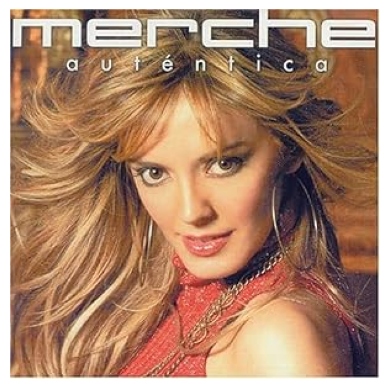

In [279]:
merged_dataset_path = "../input/merged_dataset/images_merged"
example_img = f"{merged_dataset_path}/20509_B0001JXFWA.png" 

img = Image.open(example_img)
img_array = np.array(img)

plt.imshow(img_array)
plt.axis('off')  # Hide the axis
plt.show()

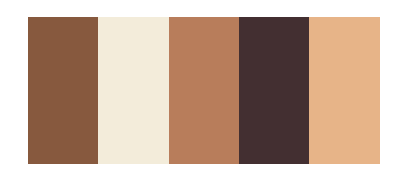

In [285]:
image = cv2.imread(example_img)

try:
    # Attempt to convert the image and reshape it
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    pixels = image.reshape((-1, 3))

except Exception as e:
    # Handle the exception if the conversion fails
    print(f"An error occurred: {e}")

else:
    # This block will be executed if no exception is raised in the try block
    # Use KMeans to find dominant colors
    kmeans = KMeans(n_clusters=5, n_init=10)
    kmeans.fit(pixels)
    dominant_colors = kmeans.cluster_centers_

plt.figure(figsize=(5, 2))
for i, color in enumerate(dominant_colors):
    plt.bar(i, height=1, color=color/255, width=1)

plt.axis('off')
plt.show()

In [284]:
for color in dominant_colors:
    normalized_color = [x / 255.0 for x in color]
    print(normalized_color)
    hsv_color = rgb_   to_hsv(normalized_color)
    hue = hsv_color[0] * 360 
    print(hsv_color)
    print(hue)

[0.7244905114681042, 0.49403745755660133, 0.3603340446377043]
[0.06119321 0.50263801 0.72449051]
22.02955461688955
[0.2667296649408566, 0.18709481831801097, 0.192479544046296]
[0.98873038 0.29856014 0.26672966]
355.9429375782283
[0.905936407571904, 0.7096329856529996, 0.5360092746366496]
[0.07822428 0.40833676 0.90593641]
28.160742301658324
[0.5329093695608569, 0.3524117030944404, 0.24374785001720614]
[0.06263158 0.54260919 0.53290937]
22.547367972486555
[0.9518013455382054, 0.9251900760303942, 0.8556566376550518]
[0.12053608 0.10101342 0.95180135]
43.39298952981225


In [40]:
def classify_warm_cool_palette(image_name, merged_dataset_path):
    
    if ".png" not in image_name:
        local_file_name = f"{merged_dataset_path}/{image_name}.png"
    else:
        local_file_name = f"{merged_dataset_path}/{image_name}"
        
    image = cv2.imread(local_file_name)
    
    try:
        # Attempt to convert the image and reshape it
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        pixels = image.reshape((-1, 3))

    except Exception as e:
        # Handle the exception if the conversion fails
        print(f"An error occurred: {e}")
        return None

    else:
        # This block will be executed if no exception is raised in the try block
        # Use KMeans to find dominant colors
        kmeans = KMeans(n_clusters=5, n_init=10)
        kmeans.fit(pixels)
        dominant_colors = kmeans.cluster_centers_
        
        warm_count = 0
        cool_count = 0
        
        for color in dominant_colors:
            normalized_color = [x / 255.0 for x in color]
            
            hsv_color = rgb_to_hsv(normalized_color)
            hue = hsv_color[0] * 360 
            
            if (hue >= 0 and hue < 180):
                warm_count += 1
            elif (hue >= 180 and hue <= 360):
                cool_count += 1
        
        if warm_count > cool_count:
            return 'Warm'
        elif cool_count > warm_count:
            return 'Cool'
        else:
            return 'Neutral' 


def classify_type_palette(image_name, merged_dataset_path):    


    if ".png" not in image_name:
        local_file_name = f"{merged_dataset_path}/{image_name}.png"
    else:
        local_file_name = f"{merged_dataset_path}/{image_name}"
        
    image = cv2.imread(local_file_name)
    
    try:
        # Attempt to convert the image and reshape it
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        pixels = image.reshape((-1, 3))

    except Exception as e:
        # Handle the exception if the conversion fails
        print(f"An error occurred: {e}")
        return None

    else:
        # This block will be executed if no exception is raised in the try block
        # Use KMeans to find dominant colors
        kmeans = KMeans(n_clusters=5, n_init=10)
        kmeans.fit(pixels)
        dominant_colors = kmeans.cluster_centers_

    
        hsv_colors = np.array([rgb_to_hsv(color/255) for color in dominant_colors])
        hues = hsv_colors[:, 0] * 360  # Convert hue to degrees for easier analysis
        
        hue_differences = np.sort((np.diff(np.sort(hues)) + 180) % 360 - 180)
        min_diff = np.min(hue_differences)
        max_diff = np.max(hue_differences)
    
        if np.all(hue_differences < 30):  # Monochromatic threshold
            return 'Monochromatic'
        elif np.all(hue_differences < 60):  # Analogous threshold
            return 'Analogous'
        elif np.any(np.isclose(hue_differences, 180, atol=10)):  # Complementary threshold
            return 'Complementary'
        elif len(hues) >= 3 and np.all(np.isclose(hue_differences, 120, atol=10)):  # Triadic threshold, needs at least 3 colors
            return 'Triadic'
        else:
            return 'Complex/Mixed'

In [31]:

def calculate_symmetry_score(image_name):
    print(image_name)
    merged_dataset_path = "../input/merged_dataset/images_merged"

    if ".png" not in image_name:
        local_file_name = f"{merged_dataset_path}/{image_name}.png"
    else:
        local_file_name = f"{merged_dataset_path}/{image_name}"
        
    image = cv2.imread(local_file_name)
    
    try:
        # Convert to grayscale and split the image
        #print("calculate_symmetry_score")
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        height, width = gray_image.shape
        left_half = gray_image[:, :width // 2]
        right_half = cv2.flip(gray_image[:, width // 2:], 1)

    except Exception as e:
        # Handle any exceptions that occur during conversion and processing
        print(f"An error occurred during image processing: {e}")
        return None

    else:
        # This block will be executed if no exception is raised in the try block
        # Calculate histograms and symmetry score
        hist_left = cv2.calcHist([left_half], [0], None, [256], [0, 256])
        hist_right = cv2.calcHist([right_half], [0], None, [256], [0, 256])
        
        score = cv2.compareHist(hist_left, hist_right, cv2.HISTCMP_CORREL)
        return score


def classify_symmetry(score):
    print("classify_symmetry")
    if not score:
        return "N/A"
    if score > 0.8:
        return "High Symmetry"
    elif score > 0.5:
        return "Moderate Symmetry"
    elif score > -0.5:
        return "Low Symmetry"
    else:
        return "Negative Symmetry"




In [34]:
def analyze_use_of_space(image_name):
    print(image_name)
    merged_dataset_path = "../input/merged_dataset/images_merged"

    if ".png" not in image_name:
        local_file_name = f"{merged_dataset_path}/{image_name}.png"
    else:
        local_file_name = f"{merged_dataset_path}/{image_name}"
        
    image = cv2.imread(local_file_name)
    try:
        # Convert the image to grayscale
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    except Exception as e:
        # Handle any exceptions that occur during conversion
        print(f"An error occurred while converting the image to grayscale: {e}")
        return None

    try:
        # Detect edges using Canny
        edges = cv2.Canny(gray_image, 100, 200)
    except Exception as e:
        # Handle any exceptions that occur during edge detection
        print(f"An error occurred while detecting edges: {e}")
        return None

    # Calculate the negative space ratio
    total_pixels = gray_image.size
    edge_pixels = np.count_nonzero(edges)
    negative_space_ratio = (total_pixels - edge_pixels) / total_pixels

    return negative_space_ratio

def classify_use_of_space(negative_space_ratio):
    if not negative_space_ratio:
        return None
        
    if negative_space_ratio > 0.8:
        return "High use of negative space"
    elif negative_space_ratio > 0.6:
        return "Moderate use of negative space"
    else:
        return "Low use of negative space"


In [ ]:
merged_dataset_path = "../input/merged_dataset/images_merged"
df = pd.read_csv(f"input/merged_dataset/merged_metadata_not_pivoted.csv",  header=0)


df['warm_cool_palette'] = df['m_name_image'].apply(lambda x: classify_warm_cool_palette(x, merged_dataset_path))
df['type_palette'] = df['m_name_image'].apply(lambda x: classify_type_palette(x, merged_dataset_path))

df['simmetry_score'] = df['m_name_image'].apply(calculate_symmetry_score)
df['simmetry_classification'] = df['simmetry_score'].apply(classify_symmetry)


In [ ]:
df['use_space_score'] = df['m_name_image'].apply(analyze_use_of_space)
df['use_space_classification'] = df['use_space_score'].apply(classify_use_of_space)


In [46]:
df.to_csv(f"../input/merged_dataset/merged_stats.csv", index=False)

## After collecting stats

In [26]:
merged_df = pd.read_csv(f"../input/merged_dataset/merged_metadata_pivoted.csv",  header=0)


In [27]:
unique_single_genres = merged_df['m_single_genre'].unique()


array([nan, 'Rap', 'Blues', 'Reggae', 'Metal', 'Folk', 'Rock',
       'Latin Music', 'Jazz', 'Electronic', 'Country', 'Punk',
       'Rap & Hip-Hop', 'Pop', 'New Age', 'World', 'RnB',
       'Alternative Rock', 'Dance & Electronic', 'Latin', 'R&B',
       'Classical', 'Gospel'], dtype=object)

In [273]:
df = pd.read_csv(f"../input/merged_dataset/merged_stats.csv",  header=0)

def map_year_to_decade(year):
    return (year // 10) * 10
df['decade'] = df['m_year'].apply(map_year_to_decade)

rock_df = df[df['m_single_genre'] == 'Rock']
electronic_df = df[df['m_single_genre'] == 'Electronic']
pop_df = df[df['m_single_genre'] == 'Pop']


In [271]:
print("------------------------- whole dataset -------------------------")
decade_counts = df['decade'].value_counts()
decade_counts_df = decade_counts.reset_index()
decade_counts_df['Percentage'] = round((decade_counts_df['count'] * 100) / len(df), 3)
print(decade_counts_df)

------------------------- whole dataset -------------------------
    decade  count  Percentage
0   2000.0  18937      40.426
1   1990.0  11124      23.747
2      0.0   9609      20.513
3   1980.0   3536       7.548
4   1970.0   2001       4.272
5   1960.0    863       1.842
6   2010.0    574       1.225
7   1950.0    150       0.320
8   1940.0     25       0.053
9   1930.0     14       0.030
10  1920.0     11       0.023


In [269]:

print("------------------------- Rock -------------------------")
decade_counts = rock_df['decade'].value_counts()
decade_counts_df = decade_counts.reset_index()
decade_counts_df['Percentage'] = round((decade_counts_df['count'] * 100) / len(rock_df), 3)
print(decade_counts_df)

print(" -------------------------Electronic -------------------------")
decade_counts = electronic_df['decade'].value_counts()
decade_counts_df = decade_counts.reset_index()
decade_counts_df['Percentage'] = round((decade_counts_df['count'] * 100) / len(electronic_df), 3)
print(decade_counts_df)


print("-------------------------- Pop-------------------------")

decade_counts = pop_df['decade'].value_counts()
decade_counts_df = decade_counts.reset_index()
decade_counts_df['Percentage'] = round((decade_counts_df['count'] * 100) / len(pop_df), 3)
print(decade_counts_df)

------------------------- Rock -------------------------
   decade  count  Percentage
0  2000.0   2166      50.797
1  1990.0    855      20.052
2     0.0    583      13.673
3  1980.0    365       8.560
4  1970.0    166       3.893
5  2010.0     76       1.782
6  1960.0     53       1.243
 -------------------------Electronic -------------------------
   decade  count  Percentage
0  2000.0   1613      63.404
1  1990.0    406      15.959
2     0.0    401      15.763
3  2010.0     83       3.263
4  1980.0     35       1.376
5  1970.0      3       0.118
6  1960.0      3       0.118
-------------------------- Pop-------------------------
   decade  count  Percentage
0  2000.0   1146      58.261
1  1990.0    333      16.929
2     0.0    290      14.743
3  1980.0    116       5.897
4  1970.0     41       2.084
5  2010.0     27       1.373
6  1960.0     13       0.661
7  1950.0      1       0.051


In [15]:

print("------------------------- Rock -------------------------")
country_counts = rock_df['m_artist_location_country'].value_counts()
country_counts_df = country_counts.reset_index()
country_counts_df['Percentage'] = round((country_counts_df['count'] * 100) / len(rock_df), 3)
print(country_counts_df)

print(" -------------------------Electronic -------------------------")
country_counts = electronic_df['m_artist_location_country'].value_counts()
country_counts_df = country_counts.reset_index()
country_counts_df['Percentage'] = round((country_counts_df['count'] * 100) / len(electronic_df), 3)
print(country_counts_df)


print("-------------------------- Pop-------------------------")

country_counts = pop_df['m_artist_location_country'].value_counts()
country_counts_df = country_counts.reset_index()
country_counts_df['Percentage'] = round((country_counts_df['count'] * 100) / len(pop_df), 3)
print(country_counts_df)

------------------------- Rock -------------------------
   m_artist_location_country  count  Percentage
0              United States   1351      31.684
1             United Kingdom    661      15.502
2                     Canada    173       4.057
3                     Sweden     75       1.759
4                  Australia     61       1.431
..                       ...    ...         ...
71                     Korea      1       0.023
72                   Türkiye      1       0.023
73                  Honduras      1       0.023
74                    Latvia      1       0.023
75                    Belize      1       0.023

[76 rows x 3 columns]
 -------------------------Electronic -------------------------
         m_artist_location_country  count  Percentage
0                   United Kingdom    443      17.414
1                    United States    307      12.068
2                          Germany     76       2.987
3                           Canada     53       2.083
4          

In [16]:
print("------------- Rock ------------")

albums_per_year_r = rock_df.groupby('m_year').size().reset_index(name='album_count')
albums_per_year_r = albums_per_year_r.sort_values('m_year')
print(albums_per_year_r)

print(" -------------------------Electronic -------------------------")

albums_per_year = electronic_df.groupby('m_year').size().reset_index(name='album_count')
albums_per_year = albums_per_year.sort_values('m_year')
print(albums_per_year)

print("-------------------------- Pop-------------------------")

albums_per_year = pop_df.groupby('m_year').size().reset_index(name='album_count')
albums_per_year = albums_per_year.sort_values('m_year')
print(albums_per_year)

------------- Rock ------------
    m_year  album_count
0      0.0          583
1   1960.0            1
2   1961.0            1
3   1962.0            1
4   1964.0            4
5   1965.0            2
6   1966.0            8
7   1967.0            5
8   1968.0           17
9   1969.0           14
10  1970.0            6
11  1971.0           18
12  1972.0           16
13  1973.0           16
14  1974.0           20
15  1975.0            8
16  1976.0           16
17  1977.0           16
18  1978.0           26
19  1979.0           24
20  1980.0           23
21  1981.0           31
22  1982.0           37
23  1983.0           25
24  1984.0           27
25  1985.0           31
26  1986.0           36
27  1987.0           41
28  1988.0           58
29  1989.0           56
30  1990.0           66
31  1991.0           56
32  1992.0           86
33  1993.0           73
34  1994.0           88
35  1995.0           76
36  1996.0           95
37  1997.0           94
38  1998.0          102
39  1999

## Symmetry

In [50]:
def get_classification_count(df, column_name):
    
    df_counts = df[column_name].value_counts()
    
    total_count = df_counts.sum()
    df_percentages = (df_counts / total_count) * 100

    summary = pd.DataFrame({
        'Count': df_counts,
        'Percentage': df_percentages
    })
    
    # Display the counts and percentages
    print(summary)

    return df_counts, df_percentages

def plot_classification_axis(axes, counts, percentages, genre):
    
    counts.plot(kind='bar', color='skyblue', ax=axes)
    axes.set_title(f'{genre} Frequency and Percentage of Symmetry Classifications')
    axes.set_xlabel('Symmetry Classification')
    axes.set_ylabel('Frequency', color='blue')
    axes.tick_params(axis='y', labelcolor='blue')
    
    

In [51]:
def general_classification(pop_df, rock_df, electronic_df, column_classification_name):
    print("------------- Pop ------------")
    pop_symmetry_counts, pop_symmetry_percentages =  get_classification_count(pop_df, column_classification_name)
    
    
    print("------------- Rock ------------")
    rock_symmetry_counts, rock_symmetry_percentages =  get_classification_count(rock_df, column_classification_name)
    
    
    print("------------- electronic ------------")
    
    electronic_symmetry_counts, electronic_symmetry_percentages = get_classification_count(electronic_df, column_classification_name)
    
    fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=True)  # sharey=True to share y-axis between plots
    
    # Plot for Pop
    ax1 = axes[0]
    plot_classification_axis(ax1, pop_symmetry_counts, pop_symmetry_percentages, 'Pop')
    
    # Secondary y-axis for the percentages
    ax1_2 = ax1.twinx()
    pop_symmetry_percentages.plot(kind='line', marker='o', color='darkorange', ax=ax1_2, linewidth=2)
    ax1_2.set_ylabel('Percentage', color='darkorange')
    ax1_2.tick_params(axis='y', labelcolor='darkorange')
    ax1.set_xticklabels(pop_symmetry_counts.index, rotation=45)
    
    # Plot for Rock
    ax2 = axes[1]
    plot_classification_axis(ax2, rock_symmetry_counts, rock_symmetry_percentages, 'Rock')
    
    # Secondary y-axis for the percentages
    ax2_2 = ax2.twinx()
    rock_symmetry_percentages.plot(kind='line', marker='o', color='darkorange', ax=ax2_2, linewidth=2)
    ax2_2.set_ylabel('Percentage', color='darkorange')
    ax2_2.tick_params(axis='y', labelcolor='darkorange')
    ax2.set_xticklabels(rock_symmetry_counts.index, rotation=45)
    
    # Plot for Electronic
    ax3 = axes[2]
    plot_classification_axis(ax3, electronic_symmetry_counts, electronic_symmetry_percentages, 'Electronic')
    
    # Secondary y-axis for the percentages
    ax3_2 = ax3.twinx()
    electronic_symmetry_percentages.plot(kind='line', marker='o', color='darkorange', ax=ax3_2, linewidth=2)
    ax3_2.set_ylabel('Percentage', color='darkorange')
    ax3_2.tick_params(axis='y', labelcolor='darkorange')
    ax3.set_xticklabels(electronic_symmetry_counts.index, rotation=45)
    
    plt.tight_layout()
    
    # Display the plot
    plt.show()


def plot_scores_for_intervals(pop_df, rock_df, electronic_df, intervals, column_name):
    # Determine the number of rows and columns for the subplot grid
    n_rows = len(intervals)
    n_cols = 3  # Three genres now
    
    # Create a figure with subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 6 * n_rows))
    
    for i, (start_year, end_year) in enumerate(intervals):
        for j, df in enumerate([pop_df, rock_df, electronic_df]):
            # Filter the DataFrame for the given interval
            interval_df = df[(df['m_year'] >= start_year) & (df['m_year'] < end_year)]
            
            # Select the current axis for plotting
            ax = axes[i, j] if n_rows > 1 else axes[j]
            
            # Plotting the symmetry scores for the interval using a line plot
            sns.lineplot(data=interval_df, x='m_year', y=column_name, marker='o', ax=ax)
            
            # Adding titles and labels
            genre = 'Pop' if j == 0 else 'Rock' if j == 1 else 'Electronic'
            ax.set_title(f'{genre}  Scores between {start_year} and {end_year}')
            ax.set_xlabel('Year')
            ax.set_ylabel('Score')
            ax.grid(True)
            # Ensure only years in the interval are shown and adjust x-ticks for readability
            ax.set_xticks(range(start_year, end_year, max((end_year - start_year) // 10, 1)))

    # Adjust layout
    plt.tight_layout()
    plt.show()



In [52]:
def get_pivot_table(df, column_name):
    decade_counts = df.groupby(['decade', column_name]).size().reset_index(name='count')
    pivot_table = decade_counts.pivot(index='decade', columns=column_name, values='count').fillna(0)

    row_sums = pivot_table.sum(axis=1)
    pivot_table_percentage = (pivot_table.T / row_sums).T * 100

    # Verify that the percentages sum to 100
    assert (pivot_table_percentage.sum(axis=1).round() == 100).all(), "Percentages do not sum to 100."

    return pivot_table, pivot_table_percentage

def plot_decades_classification(pivot_table_pop, pivot_table_percentage_pop,pivot_table_rock, pivot_table_percentage_rock,
                               pivot_table_electronic, pivot_table_percentage_electronic):
    
    unique_decades = sorted(set(pivot_table_pop.index).union(set(pivot_table_rock.index)).union(set(pivot_table_electronic.index)))

    # Calculate layout dimensions
    n_columns = 3  # One column per genre
    n_decades = len(unique_decades)
    n_rows = n_decades  # One row for each decade
    
    fig, axes = plt.subplots(n_rows, n_columns, figsize=(20, n_rows * 6), constrained_layout=True)
    
    # Ensure axes is a 2D array for easy indexing if there's only one row
    if n_rows == 1:
        axes = np.array([axes])
    
    for i, decade in enumerate(unique_decades):
        # Each genre gets plotted in the same row but different columns
        ax_pop = axes[i, 0]  # First column for Pop
        ax_rock = axes[i, 1]  # Second column for Rock
        ax_electronic = axes[i, 2]  # Third column for Electronic
    
        # Plot Pop
        if decade in pivot_table_pop.index:
            counts_pop = pivot_table_pop.loc[decade]
            percentages_pop = pivot_table_percentage_pop.loc[decade]
            counts_pop.plot(kind='bar', color='skyblue', ax=ax_pop)
            ax_pop.set_title(f'Pop {decade}s')
            ax_pop.set_ylabel('Frequency')
            percentages_pop.plot(kind='line', marker='o', color='darkorange', ax=ax_pop.twinx(), linewidth=2)
    
        # Plot Rock
        if decade in pivot_table_rock.index:
            counts_rock = pivot_table_rock.loc[decade]
            percentages_rock = pivot_table_percentage_rock.loc[decade]
            counts_rock.plot(kind='bar', color='green', ax=ax_rock)
            ax_rock.set_title(f'Rock {decade}s')
            ax_rock.set_ylabel('Frequency')
            percentages_rock.plot(kind='line', marker='o', color='darkorange', ax=ax_rock.twinx(), linewidth=2)
    
        # Plot Electronic
        if decade in pivot_table_electronic.index:
            counts_electronic = pivot_table_electronic.loc[decade]
            percentages_electronic = pivot_table_percentage_electronic.loc[decade]
            counts_electronic.plot(kind='bar', color='red', ax=ax_electronic)
            ax_electronic.set_title(f'Electronic {decade}s')
            ax_electronic.set_ylabel('Frequency')
            percentages_electronic.plot(kind='line', marker='o', color='darkorange', ax=ax_electronic.twinx(), linewidth=2)
    
    # Adjust subplot parameters for a clean layout
    plt.tight_layout()
    plt.show()

def decade_classification(pop_df, rock_df, electronic_df, column_name):
    # Pop
    pivot_table_pop, pivot_table_percentage_pop = get_pivot_table(pop_df, column_name)
    
    # Rock
        
    pivot_table_rock, pivot_table_percentage_rock = get_pivot_table(rock_df, column_name)
    
    # Electronic
    
    pivot_table_electronic, pivot_table_percentage_electronic = get_pivot_table(electronic_df, column_name)
    
    
    plot_decades_classification(pivot_table_pop, pivot_table_percentage_pop,pivot_table_rock, pivot_table_percentage_rock,
                                   pivot_table_electronic, pivot_table_percentage_electronic)




------------- Pop ------------
                         Count  Percentage
simmetry_classification                   
High Symmetry              966   49.110320
Moderate Symmetry          573   29.130656
Low Symmetry               427   21.708185
Negative Symmetry            1    0.050839
------------- Rock ------------
                         Count  Percentage
simmetry_classification                   
High Symmetry             2554   59.896811
Moderate Symmetry         1089   25.539400
Low Symmetry               617   14.469981
Negative Symmetry            4    0.093809
------------- electronic ------------
                         Count  Percentage
simmetry_classification                   
High Symmetry             1592   62.578616
Moderate Symmetry          574   22.562893
Low Symmetry               378   14.858491


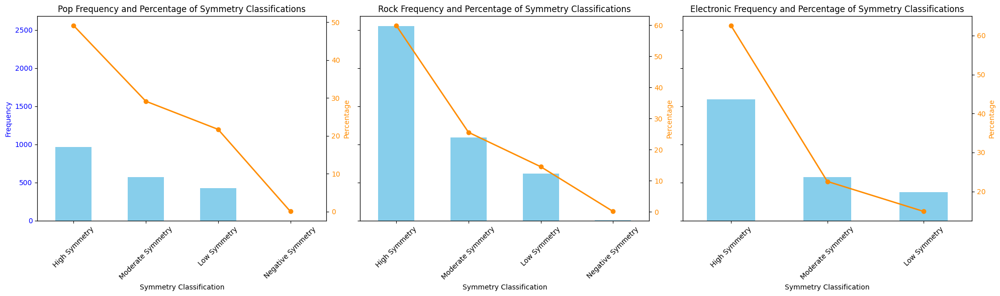

In [20]:
general_classification(pop_df, rock_df, electronic_df, 'simmetry_classification')


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_41947/3339639028.py:65: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


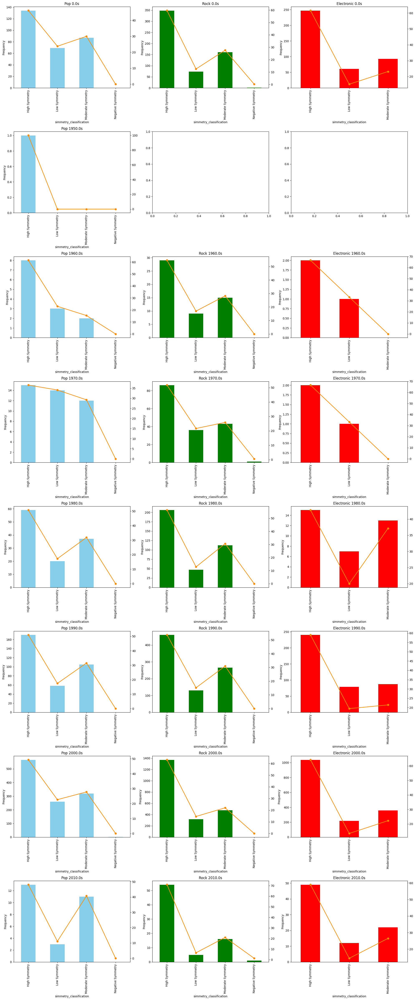

In [21]:
decade_classification(pop_df, rock_df, electronic_df,  'simmetry_classification')

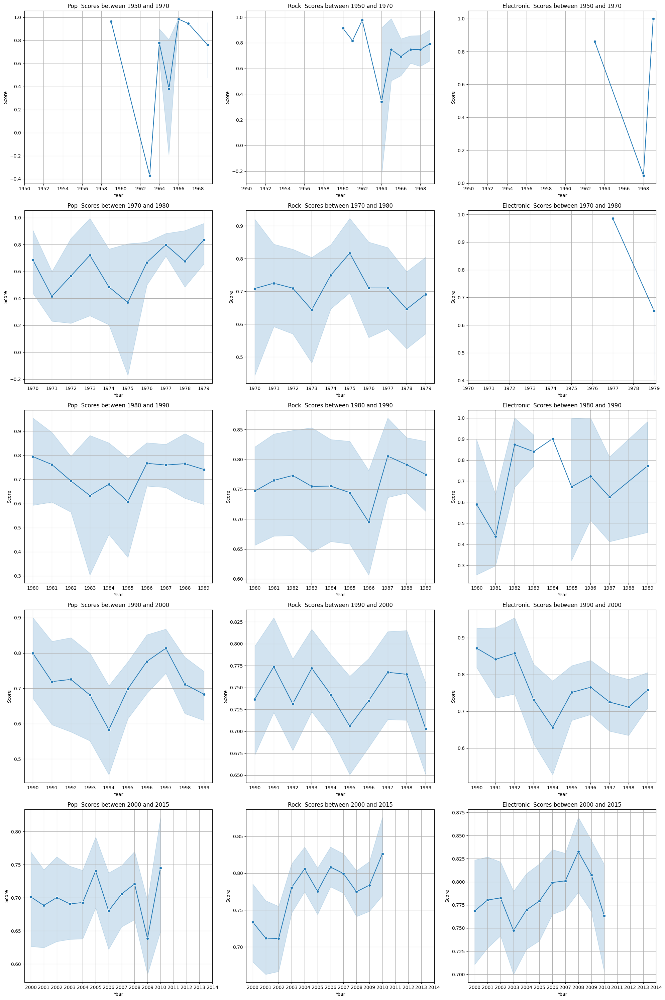

In [23]:

# Define your intervals
intervals = [(1950,1970), (1970, 1980), (1980, 1990), (1990, 2000), (2000, 2015)]

# Assuming pop_df, rock_df, and electronic_df are your dataframes for the respective genres
plot_scores_for_intervals(pop_df, rock_df, electronic_df, intervals, 'simmetry_score')


## Use of negative space

------------- Pop ------------
                                Count  Percentage
use_space_classification                         
High use of negative space       1788   90.899847
Moderate use of negative space    179    9.100153
------------- Rock ------------
                                Count  Percentage
use_space_classification                         
High use of negative space       3625   85.014071
Moderate use of negative space    637   14.939024
Low use of negative space           2    0.046904
------------- electronic ------------
                                Count  Percentage
use_space_classification                         
High use of negative space       2215   87.067610
Moderate use of negative space    328   12.893082
Low use of negative space           1    0.039308


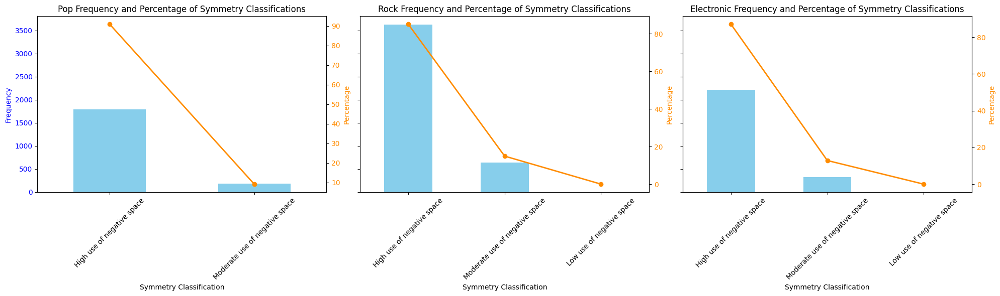

/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_41947/3339639028.py:65: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


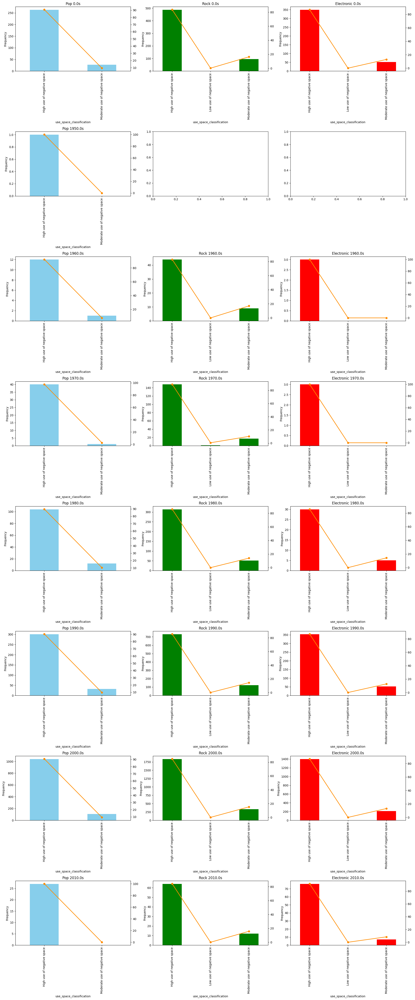

In [24]:
general_classification(pop_df, rock_df, electronic_df, 'use_space_classification')
decade_classification(pop_df, rock_df, electronic_df,  'use_space_classification')

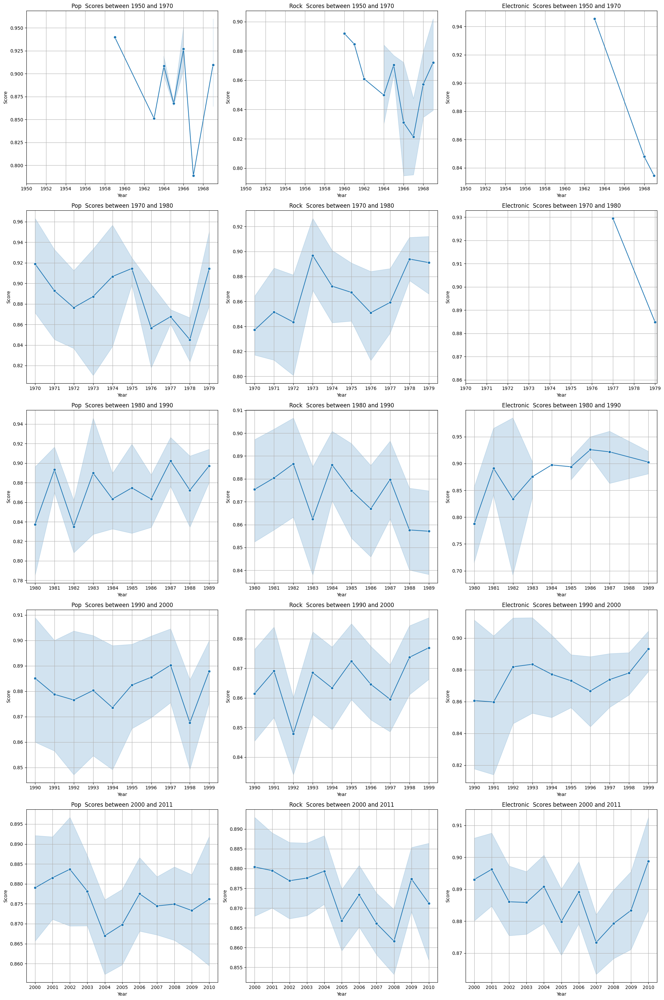

In [25]:
intervals = [(1950,1970), (1970, 1980), (1980, 1990), (1990, 2000), (2000, 2011)]

# use_space_score	
plot_scores_for_intervals(pop_df, rock_df, electronic_df, intervals, 'use_space_score')

## Cool and Warm analysis

------------- Pop ------------
                   Count  Percentage
warm_cool_palette                   
Warm                1372    69.75089
Cool                 595    30.24911
------------- Rock ------------
                   Count  Percentage
warm_cool_palette                   
Warm                2956   69.357109
Cool                1306   30.642891
------------- electronic ------------
                   Count  Percentage
warm_cool_palette                   
Warm                1609   63.246855
Cool                 935   36.753145


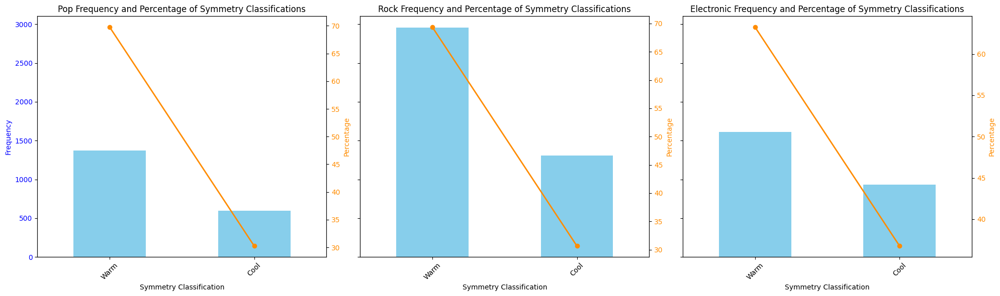

/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_41947/3339639028.py:65: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


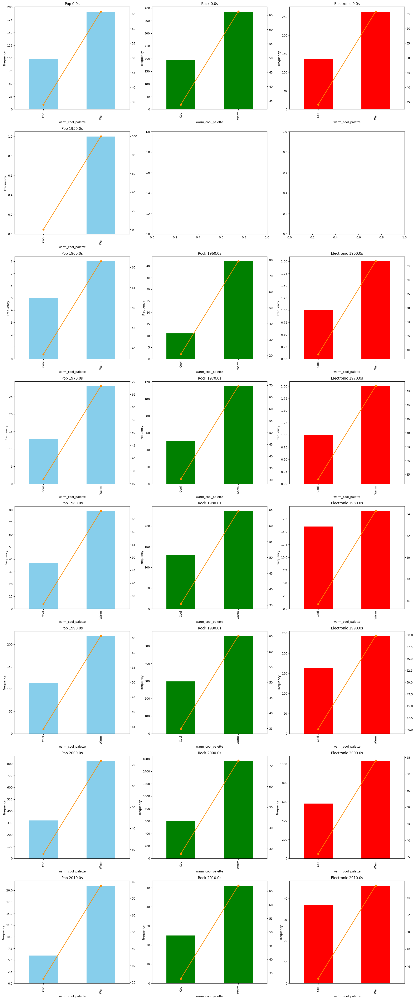

In [26]:
general_classification(pop_df, rock_df, electronic_df, 'warm_cool_palette')
decade_classification(pop_df, rock_df, electronic_df,  'warm_cool_palette')

## Palette type analysis

------------- Pop ------------
               Count  Percentage
type_palette                    
Monochromatic   1039   52.821556
Complex/Mixed    634   32.231825
Analogous        240   12.201322
Complementary     54    2.745297
------------- Rock ------------
               Count  Percentage
type_palette                    
Monochromatic   2220   52.088221
Complex/Mixed   1310   30.736743
Analogous        603   14.148287
Complementary    129    3.026748
------------- electronic ------------
               Count  Percentage
type_palette                    
Monochromatic   1398    54.95283
Complex/Mixed    773    30.38522
Analogous        318    12.50000
Complementary     55     2.16195


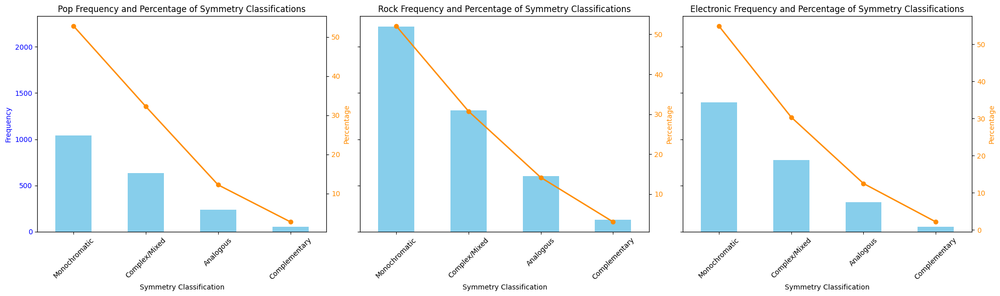

/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_41947/3339639028.py:65: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


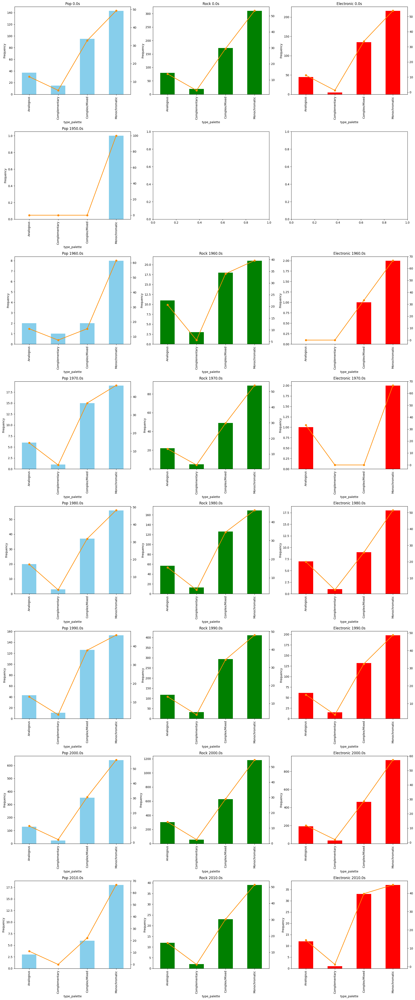

In [27]:
general_classification(pop_df, rock_df, electronic_df, 'type_palette')
decade_classification(pop_df, rock_df, electronic_df,  'type_palette')

## United states analysis

In [ ]:
pop_df['decade'] = pop_df['m_year'].apply(map_year_to_decade)
us_pop_df  = pop_df[pop_df['m_artist_location_country'] == 'United States']

rock_df['decade'] = rock_df['m_year'].apply(map_year_to_decade)
us_rock_df = rock_df[rock_df['m_artist_location_country'] == 'United States']

electronic_df['decade'] = electronic_df['m_year'].apply(map_year_to_decade)
us_electronic_df = electronic_df[electronic_df['m_artist_location_country'] == 'United States']

### Symmetry

------------- Pop ------------
                         Count  Percentage
simmetry_classification                   
High Symmetry              147   44.277108
Moderate Symmetry          106   31.927711
Low Symmetry                79   23.795181
------------- Rock ------------
                         Count  Percentage
simmetry_classification                   
High Symmetry              801   59.289415
Moderate Symmetry          347   25.684678
Low Symmetry               202   14.951887
Negative Symmetry            1    0.074019
------------- electronic ------------
                         Count  Percentage
simmetry_classification                   
High Symmetry              201   65.472313
Moderate Symmetry           73   23.778502
Low Symmetry                33   10.749186


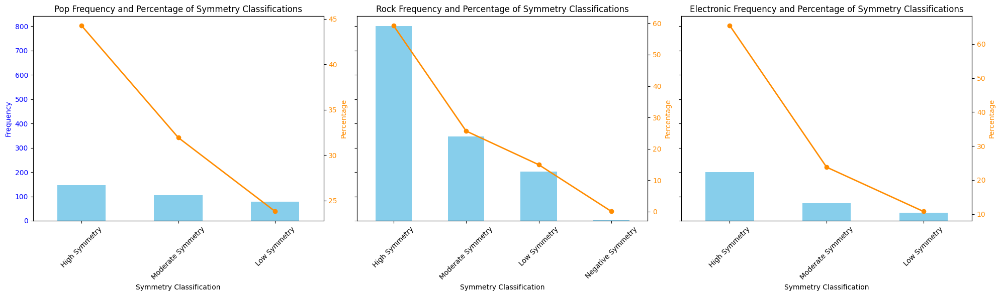

/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_41947/3339639028.py:65: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


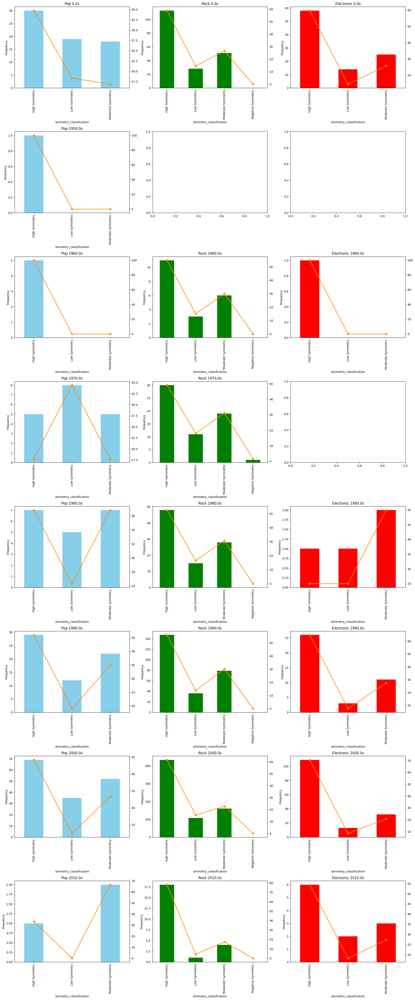

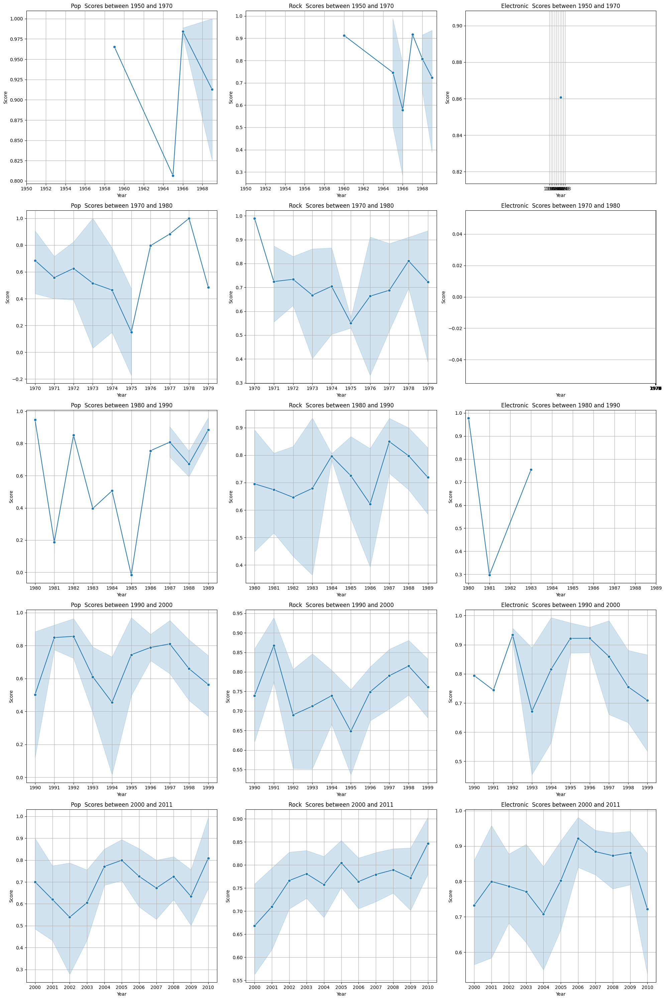

In [29]:
general_classification(us_pop_df, us_rock_df, us_electronic_df, 'simmetry_classification')
decade_classification(us_pop_df, us_rock_df, us_electronic_df, 'simmetry_classification')
plot_scores_for_intervals(us_pop_df, us_rock_df, us_electronic_df, intervals, 'simmetry_score')

### Use of negative space

------------- Pop ------------
                                Count  Percentage
use_space_classification                         
High use of negative space        297   89.457831
Moderate use of negative space     35   10.542169
------------- Rock ------------
                                Count  Percentage
use_space_classification                         
High use of negative space       1150   85.122132
Moderate use of negative space    200   14.803849
Low use of negative space           1    0.074019
------------- electronic ------------
                                Count  Percentage
use_space_classification                         
High use of negative space        265   86.319218
Moderate use of negative space     42   13.680782


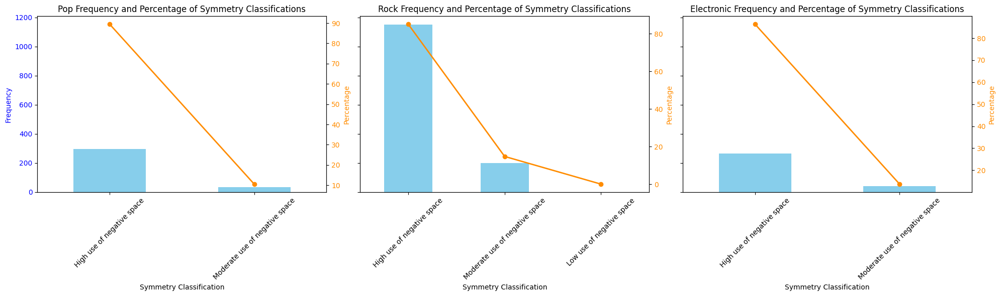

/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_41947/3339639028.py:65: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


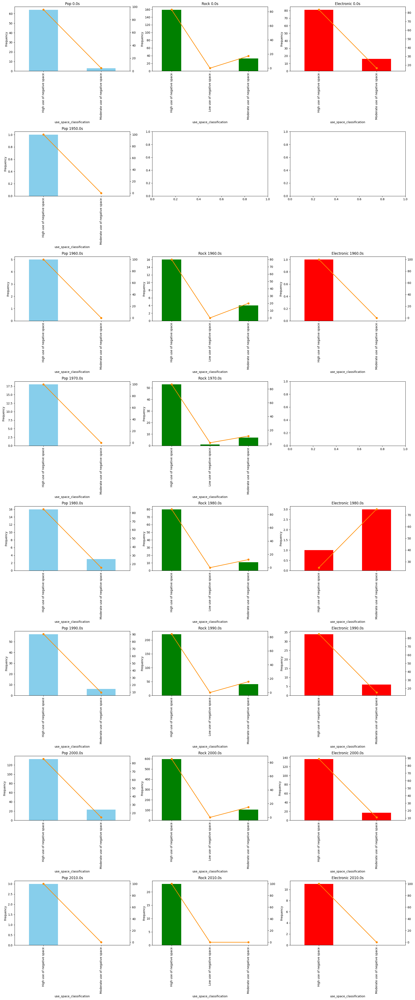

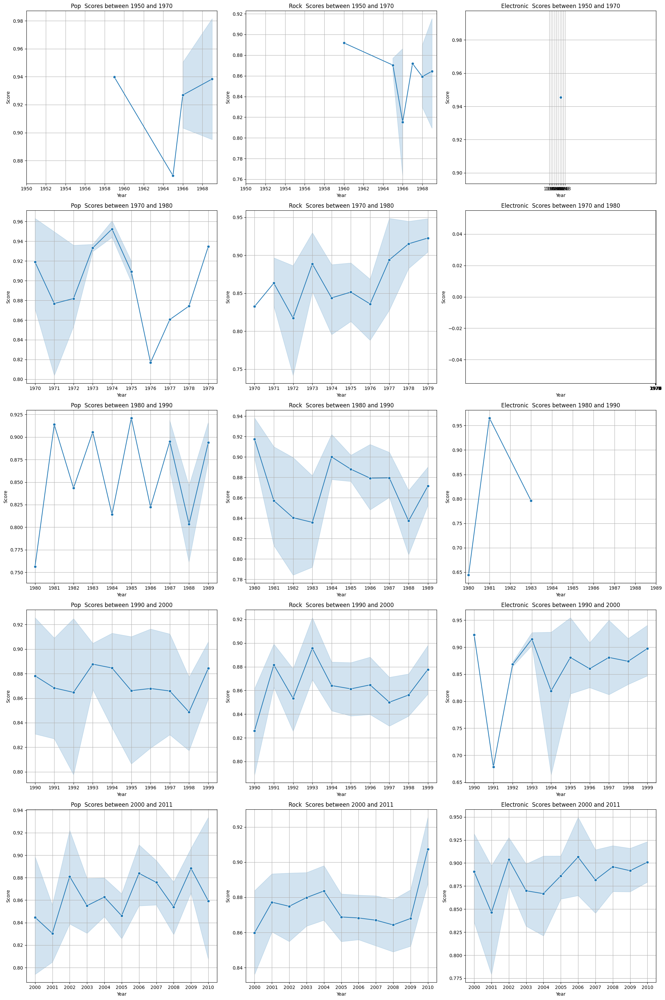

In [30]:
general_classification(us_pop_df, us_rock_df, us_electronic_df, 'use_space_classification')
decade_classification(us_pop_df, us_rock_df, us_electronic_df,  'use_space_classification')
plot_scores_for_intervals(us_pop_df, us_rock_df, us_electronic_df, intervals, 'use_space_score')

### Cool and Warm analysis

------------- Pop ------------
                   Count  Percentage
warm_cool_palette                   
Warm                 219   65.963855
Cool                 113   34.036145
------------- Rock ------------
                   Count  Percentage
warm_cool_palette                   
Warm                 965   71.481481
Cool                 385   28.518519
------------- electronic ------------
                   Count  Percentage
warm_cool_palette                   
Warm                 200    65.14658
Cool                 107    34.85342


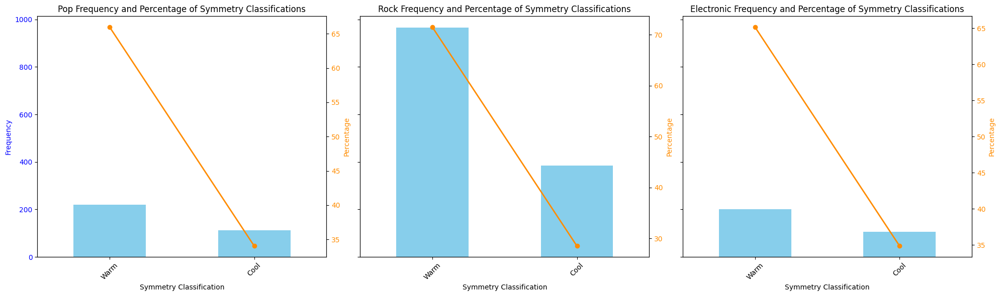

/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_41947/3339639028.py:65: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


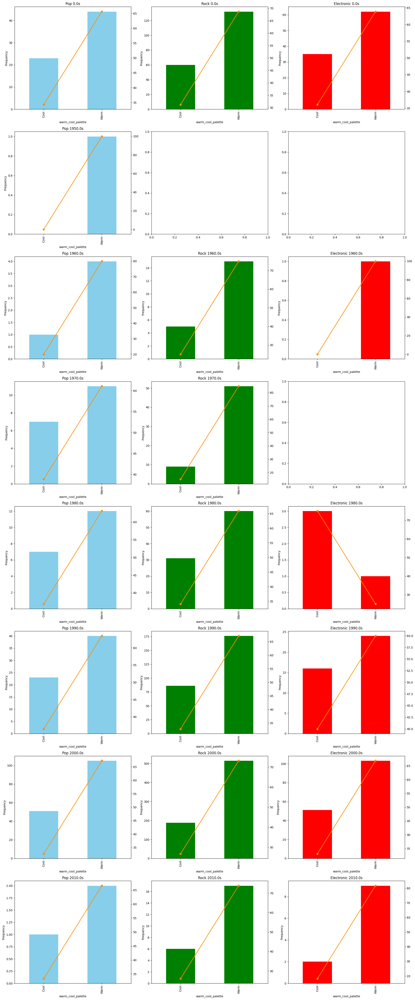

In [31]:
general_classification(us_pop_df, us_rock_df, us_electronic_df, 'warm_cool_palette')
decade_classification(us_pop_df, us_rock_df, us_electronic_df,  'warm_cool_palette')

### Type of palette analysis

------------- Pop ------------
               Count  Percentage
type_palette                    
Monochromatic    178   53.614458
Complex/Mixed    110   33.132530
Analogous         32    9.638554
Complementary     12    3.614458
------------- Rock ------------
               Count  Percentage
type_palette                    
Monochromatic    714   52.888889
Complex/Mixed    418   30.962963
Analogous        183   13.555556
Complementary     35    2.592593
------------- electronic ------------
               Count  Percentage
type_palette                    
Monochromatic    169   55.048860
Complex/Mixed     99   32.247557
Analogous         34   11.074919
Complementary      5    1.628664


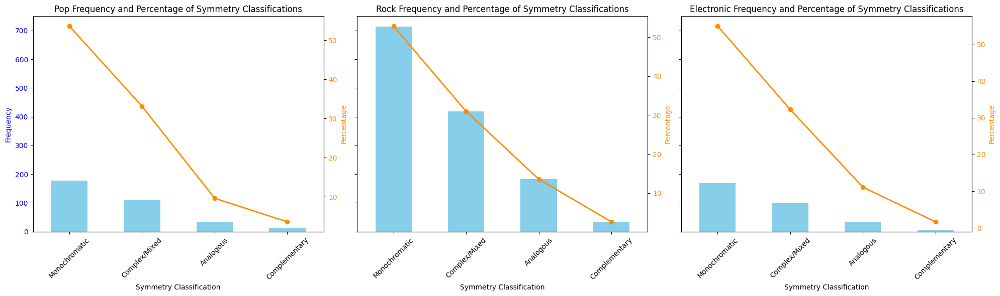

/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_41947/3339639028.py:65: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


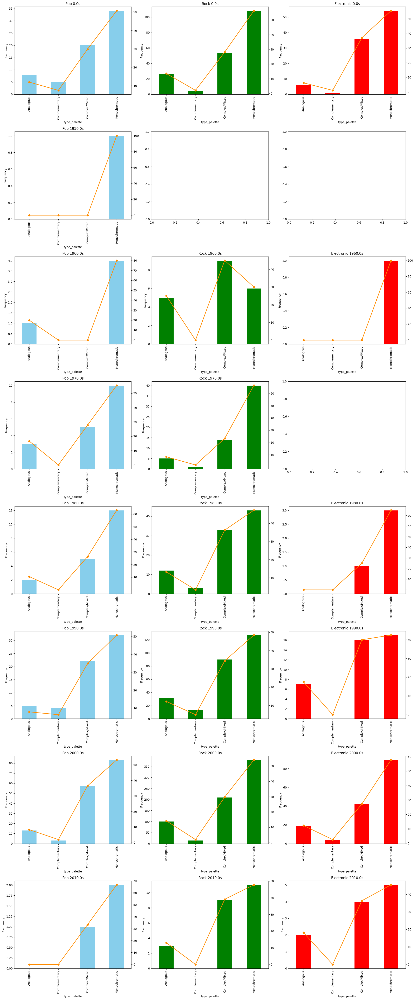

In [32]:
general_classification(us_pop_df, us_rock_df, us_electronic_df, 'type_palette')
decade_classification(us_pop_df, us_rock_df, us_electronic_df,  'type_palette')

## United Kingdom

In [170]:
uk_pop_df  = pop_df[pop_df['m_artist_location_country'] == 'United Kingdom']

uk_rock_df = rock_df[rock_df['m_artist_location_country'] == 'United Kingdom']

uk_electronic_df = electronic_df[electronic_df['m_artist_location_country'] == 'United Kingdom']

### Symmetry

------------- Pop ------------
                         Count  Percentage
simmetry_classification                   
High Symmetry              178   55.799373
Moderate Symmetry           79   24.764890
Low Symmetry                62   19.435737
------------- Rock ------------
                         Count  Percentage
simmetry_classification                   
High Symmetry              398   60.211800
Moderate Symmetry          153   23.146747
Low Symmetry               109   16.490166
Negative Symmetry            1    0.151286
------------- electronic ------------
                         Count  Percentage
simmetry_classification                   
High Symmetry              259   58.465011
Low Symmetry                94   21.218962
Moderate Symmetry           90   20.316027


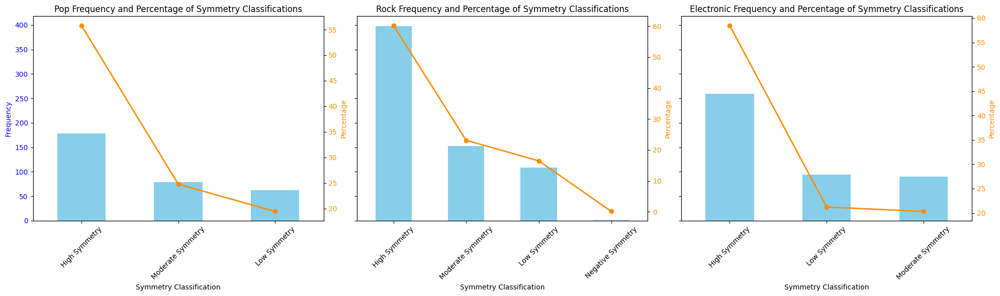

/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_41947/3339639028.py:65: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


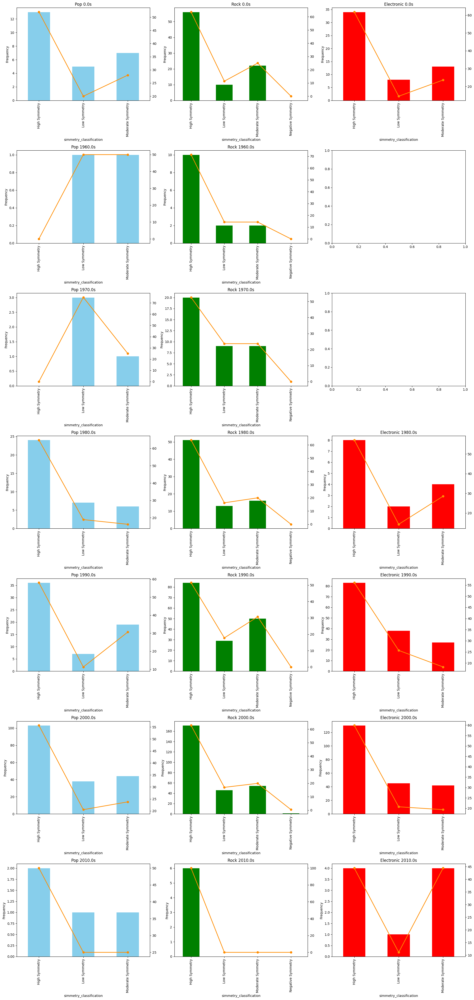

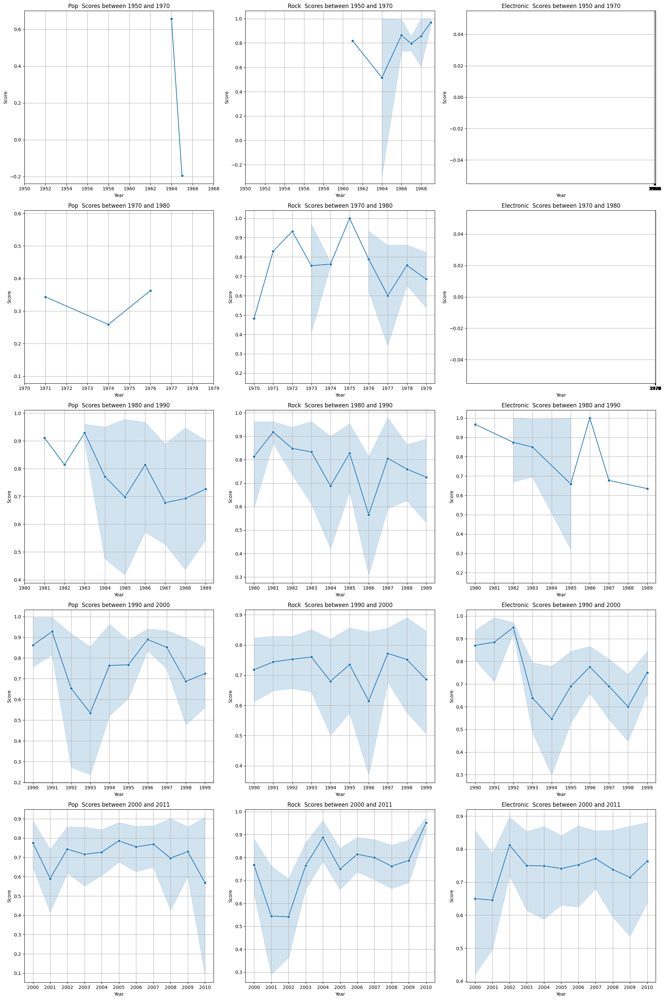

In [34]:
general_classification(uk_pop_df, uk_rock_df, uk_electronic_df, 'simmetry_classification')
decade_classification(uk_pop_df, uk_rock_df, uk_electronic_df, 'simmetry_classification')
plot_scores_for_intervals(uk_pop_df, uk_rock_df, uk_electronic_df, intervals, 'simmetry_score')

### Use of negative space

------------- Pop ------------
                                Count  Percentage
use_space_classification                         
High use of negative space        296   92.789969
Moderate use of negative space     23    7.210031
------------- Rock ------------
                                Count  Percentage
use_space_classification                         
High use of negative space        585   88.502269
Moderate use of negative space     76   11.497731
------------- electronic ------------
                                Count  Percentage
use_space_classification                         
High use of negative space        386   87.133183
Moderate use of negative space     57   12.866817


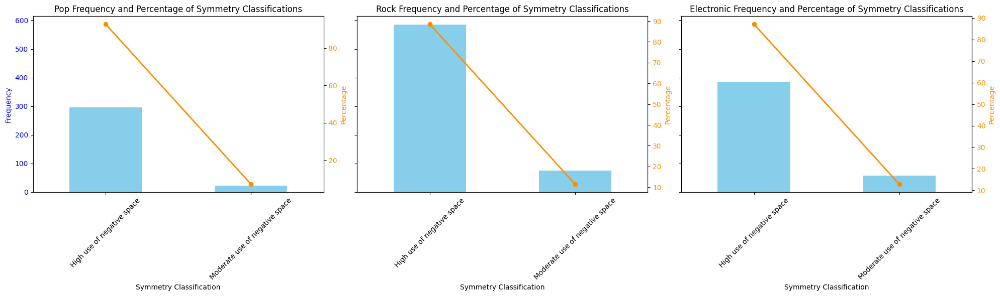

/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_41947/3339639028.py:65: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


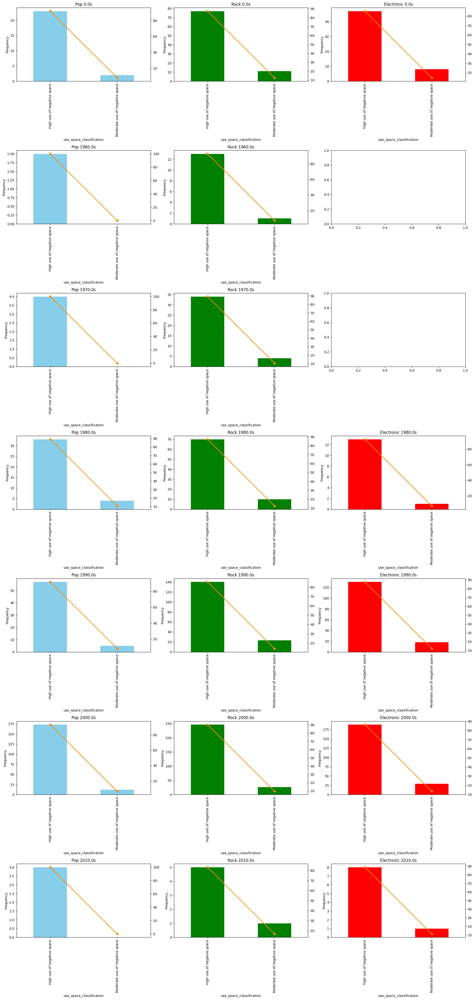

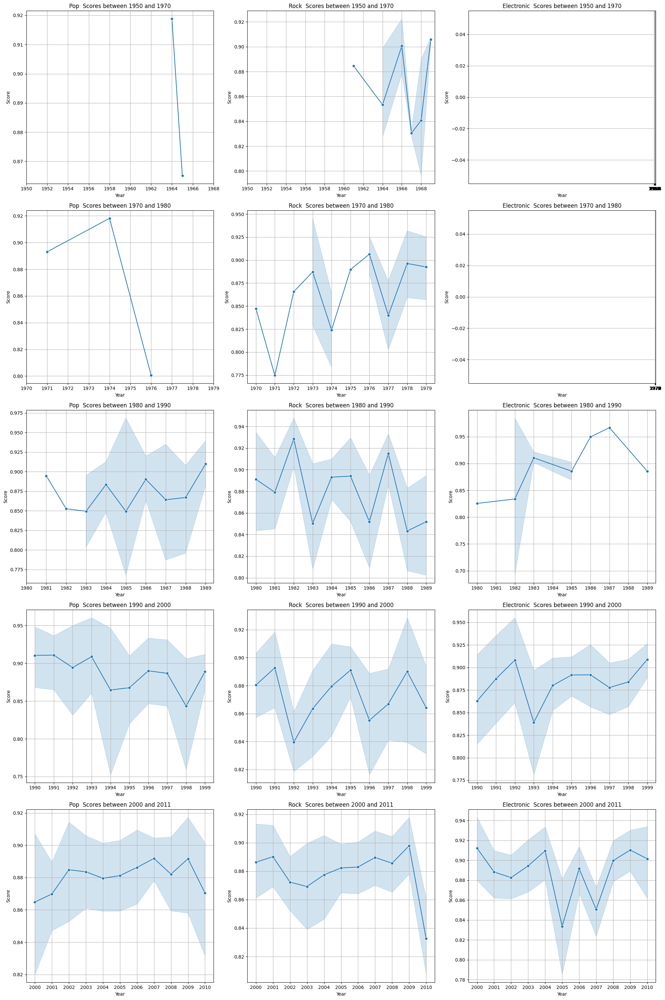

In [35]:
general_classification(uk_pop_df, uk_rock_df, uk_electronic_df, 'use_space_classification')
decade_classification(uk_pop_df, uk_rock_df, uk_electronic_df, 'use_space_classification')
plot_scores_for_intervals(uk_pop_df, uk_rock_df, uk_electronic_df, intervals, 'use_space_score')

### Cool and Warm analysis

------------- Pop ------------
                   Count  Percentage
warm_cool_palette                   
Warm                 227   71.159875
Cool                  92   28.840125
------------- Rock ------------
                   Count  Percentage
warm_cool_palette                   
Warm                 441   66.717095
Cool                 220   33.282905
------------- electronic ------------
                   Count  Percentage
warm_cool_palette                   
Warm                 283   63.882619
Cool                 160   36.117381


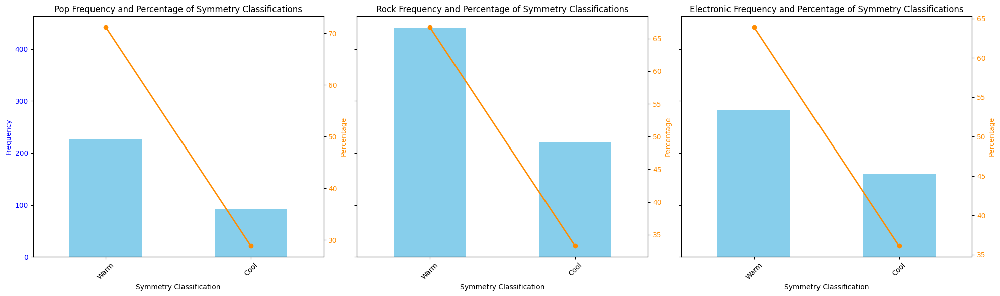

/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_41947/3339639028.py:65: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


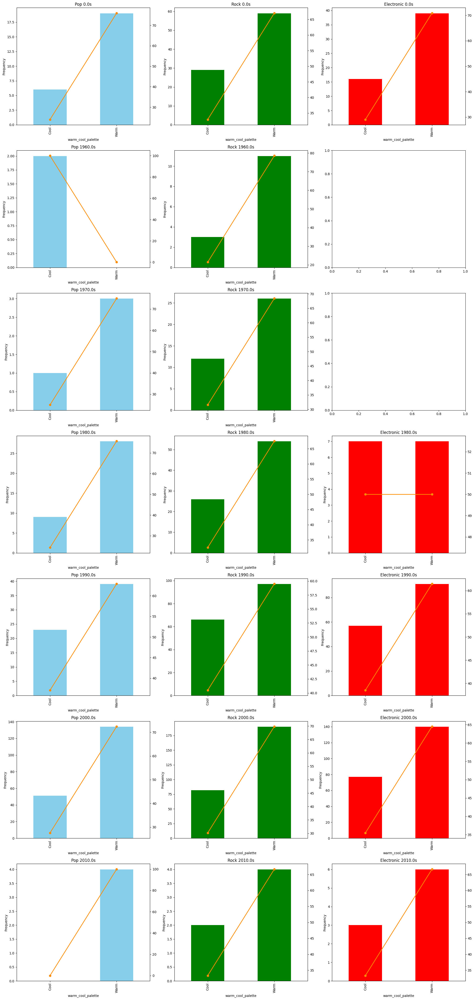

In [44]:
general_classification(uk_pop_df, uk_rock_df, uk_electronic_df, 'warm_cool_palette')
decade_classification(uk_pop_df, uk_rock_df, uk_electronic_df, 'warm_cool_palette')

### Type of palette analysis

------------- Pop ------------
               Count  Percentage
type_palette                    
Monochromatic    154   48.275862
Complex/Mixed    109   34.169279
Analogous         47   14.733542
Complementary      9    2.821317
------------- Rock ------------
               Count  Percentage
type_palette                    
Monochromatic    317   47.957640
Complex/Mixed    229   34.644478
Analogous         93   14.069592
Complementary     22    3.328290
------------- electronic ------------
               Count  Percentage
type_palette                    
Monochromatic    209   47.178330
Complex/Mixed    158   35.665914
Analogous         61   13.769752
Complementary     15    3.386005


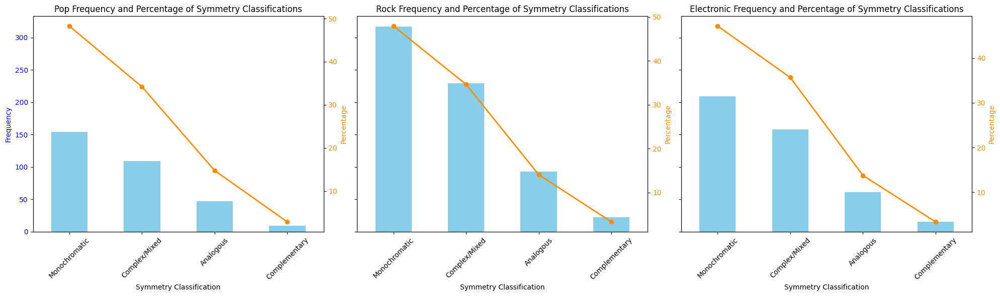

/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_41947/3339639028.py:65: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


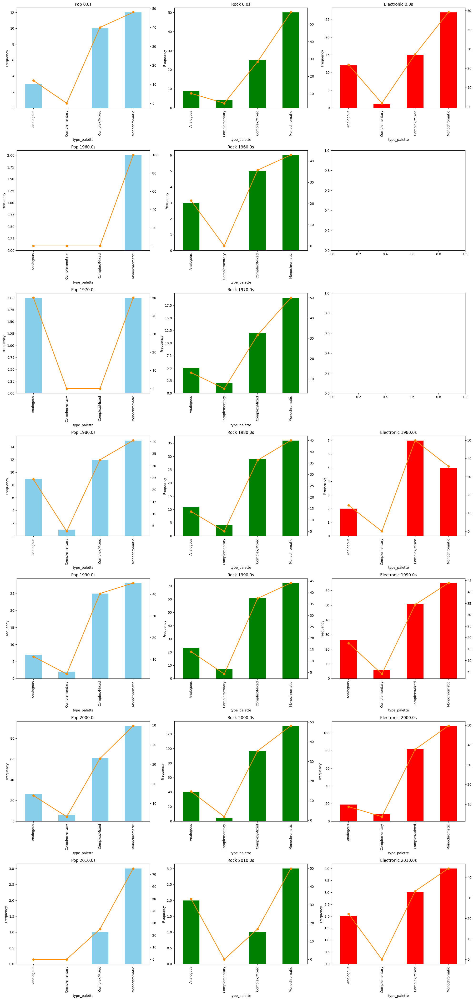

In [41]:
general_classification(uk_pop_df, uk_rock_df, uk_electronic_df, 'type_palette')
decade_classification(uk_pop_df, uk_rock_df, uk_electronic_df, 'type_palette')

## Canada

In [240]:
ca_pop_df  = pop_df[pop_df['m_artist_location_country'] == 'Canada']

ca_rock_df = rock_df[rock_df['m_artist_location_country'] == 'Canada']

ca_electronic_df = electronic_df[electronic_df['m_artist_location_country'] == 'Canada']

In [274]:
columns_to_convert = ['High Symmetry', 'Moderate Symmetry','Low Symmetry']
column_name = 'simmetry_classification'
#columns_to_convert = ['High use of negative space', 'Moderate use of negative space']
#columns_to_convert = ['High use of negative space', 'Moderate use of negative space','Low use of negative space']
#column_name = 'use_space_classification'
#columns_to_convert = ['Cool', 'Warm']
#column_name = 'warm_cool_palette'
#columns_to_convert = ['Analogous', 'Complementary','Complex/Mixed', 'Monochromatic']
#column_name = 'type_palette'

pivot_table_pop, pivot_table_percentage_pop = get_pivot_table(pop_df, column_name)
pivot_table_percentage_pop[columns_to_convert] = pivot_table_percentage_pop[columns_to_convert] / 100
pivot_table_pop['Total'] = pivot_table_pop[columns_to_convert].sum(axis=1)

# Rock
    
pivot_table_rock, pivot_table_percentage_rock = get_pivot_table(rock_df, column_name)
pivot_table_percentage_rock[columns_to_convert] = pivot_table_percentage_rock[columns_to_convert] / 100
pivot_table_rock['Total'] = pivot_table_rock[columns_to_convert].sum(axis=1)


# Electronic

pivot_table_electronic, pivot_table_percentage_electronic = get_pivot_table(electronic_df, column_name)
pivot_table_percentage_electronic[columns_to_convert] = pivot_table_percentage_electronic[columns_to_convert] / 100
pivot_table_electronic['Total'] = pivot_table_electronic[columns_to_convert].sum(axis=1)


In [276]:
pivot_table_percentage_rock

simmetry_classification,High Symmetry,Low Symmetry,Moderate Symmetry,Negative Symmetry
decade,,,,
0.0,0.596913,0.125214,0.276158,0.171527
1960.0,0.547170,0.169811,0.283019,0.000000
1970.0,0.518072,0.216867,0.259036,0.602410
1980.0,0.564384,0.128767,0.306849,0.000000
1990.0,0.538012,0.152047,0.309942,0.000000
2000.0,0.632964,0.146353,0.220222,0.046168
2010.0,0.710526,0.065789,0.210526,1.315789


### Symmetry

------------- Pop ------------
                         Count  Percentage
simmetry_classification                   
High Symmetry               32   50.793651
Moderate Symmetry           18   28.571429
Low Symmetry                13   20.634921
------------- Rock ------------
                         Count  Percentage
simmetry_classification                   
High Symmetry              113   65.317919
Moderate Symmetry           40   23.121387
Low Symmetry                20   11.560694
------------- electronic ------------
                         Count  Percentage
simmetry_classification                   
High Symmetry               34   64.150943
Moderate Symmetry           16   30.188679
Low Symmetry                 3    5.660377


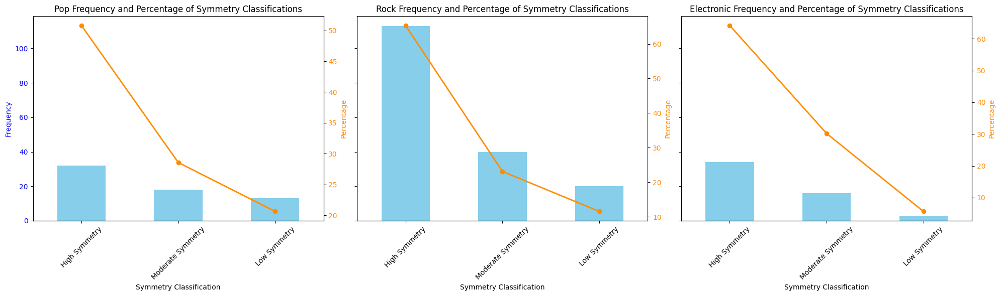

/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_41947/3339639028.py:65: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


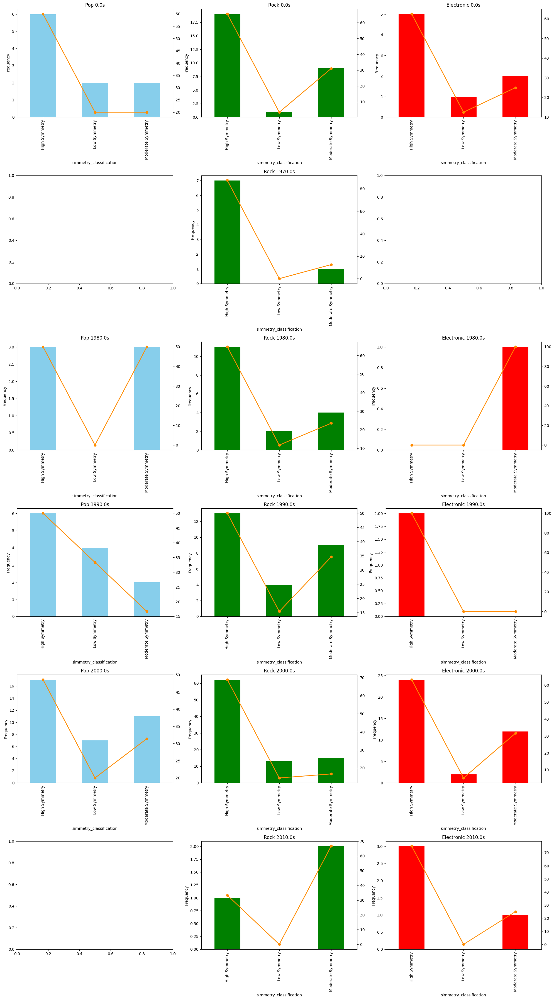

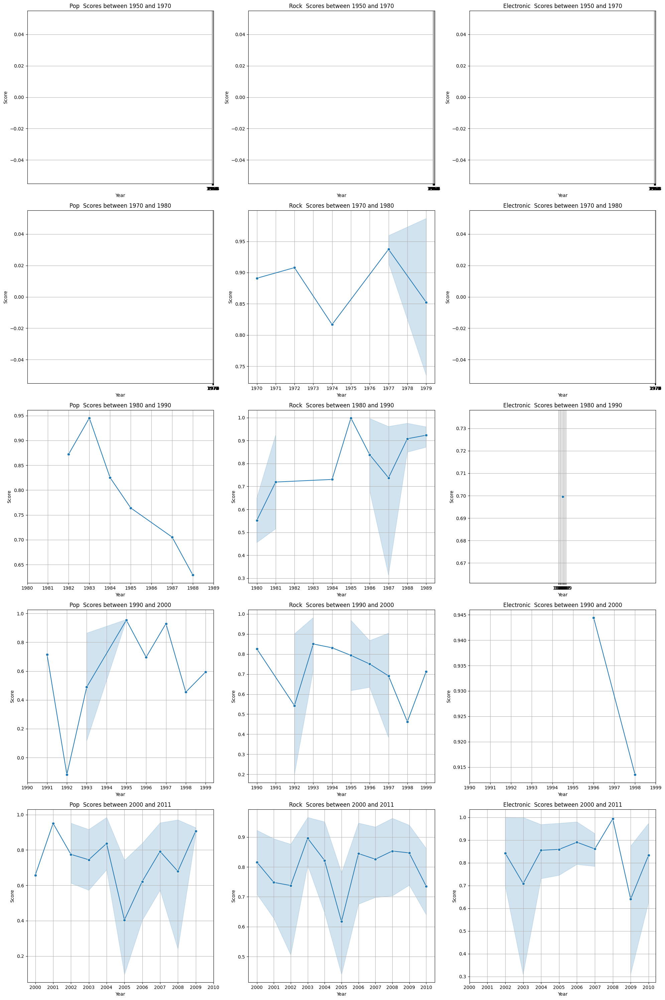

In [38]:
general_classification(ca_pop_df, ca_rock_df, ca_electronic_df, 'simmetry_classification')
decade_classification(ca_pop_df, ca_rock_df, ca_electronic_df, 'simmetry_classification')
plot_scores_for_intervals(ca_pop_df, ca_rock_df, ca_electronic_df, intervals, 'simmetry_score')

### Use of negatice space

------------- Pop ------------
                                Count  Percentage
use_space_classification                         
High use of negative space         59   93.650794
Moderate use of negative space      4    6.349206
------------- Rock ------------
                                Count  Percentage
use_space_classification                         
High use of negative space        150   86.705202
Moderate use of negative space     23   13.294798
------------- electronic ------------
                                Count  Percentage
use_space_classification                         
High use of negative space         47   88.679245
Moderate use of negative space      6   11.320755


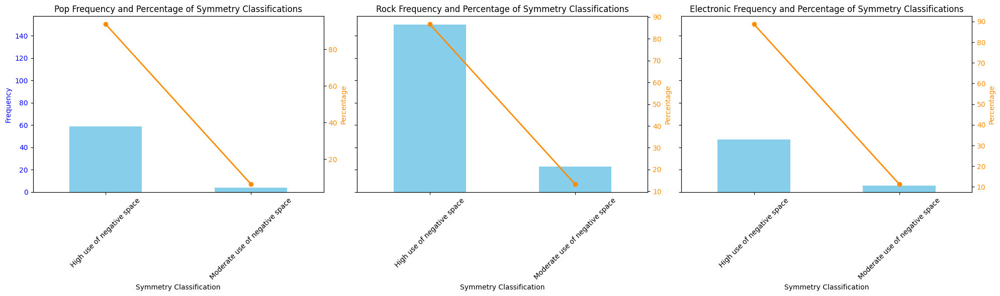

/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_41947/3339639028.py:65: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


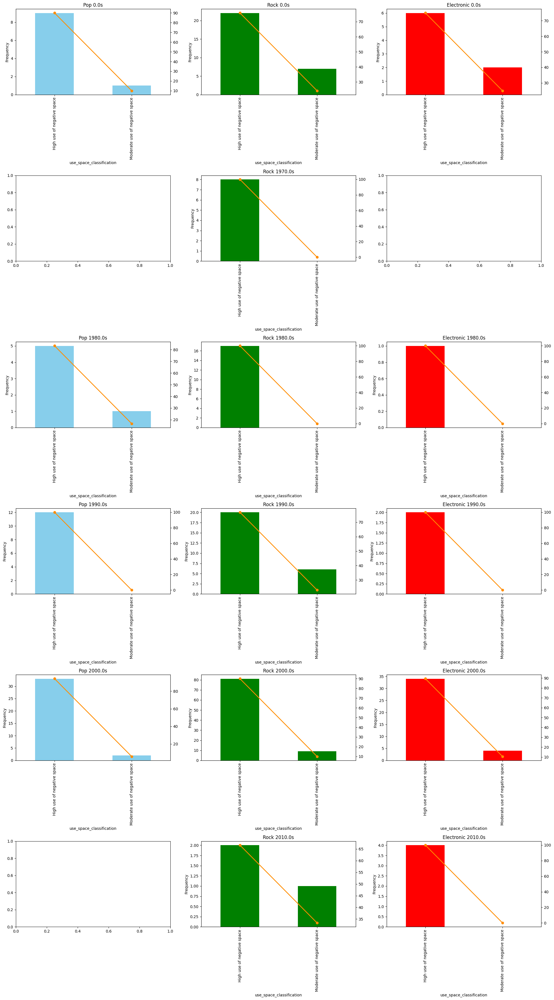

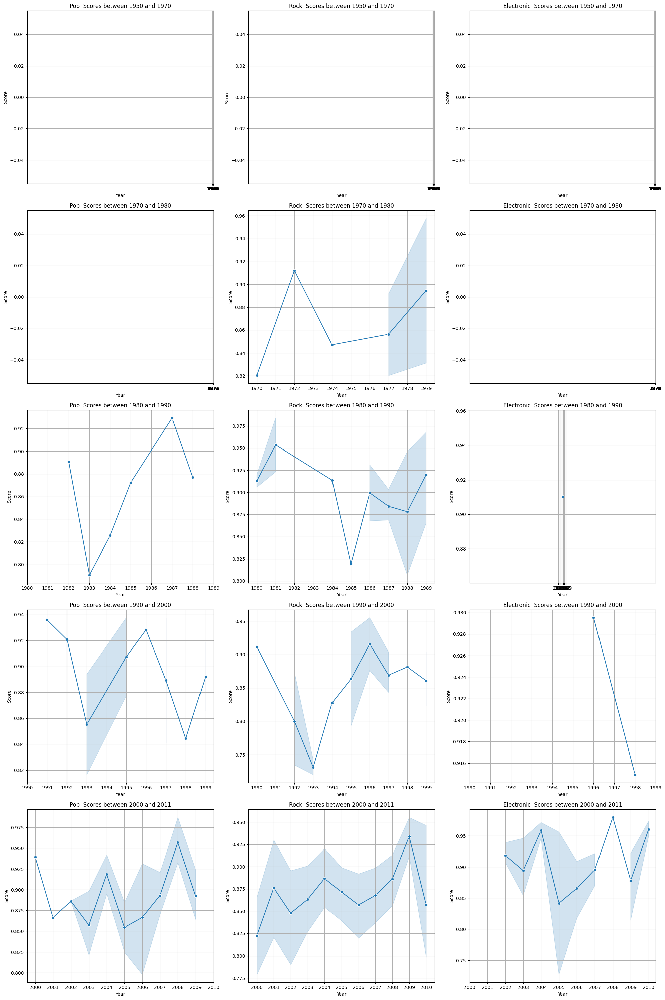

In [39]:
general_classification(ca_pop_df, ca_rock_df, ca_electronic_df, 'use_space_classification')
decade_classification(ca_pop_df, ca_rock_df, ca_electronic_df, 'use_space_classification')
plot_scores_for_intervals(ca_pop_df, ca_rock_df, ca_electronic_df, intervals, 'use_space_score')

### Cool and Warm palette

------------- Pop ------------
                   Count  Percentage
warm_cool_palette                   
Warm                  44    69.84127
Cool                  19    30.15873
------------- Rock ------------
                   Count  Percentage
warm_cool_palette                   
Warm                 119   68.786127
Cool                  54   31.213873
------------- electronic ------------
                   Count  Percentage
warm_cool_palette                   
Warm                  38   71.698113
Cool                  15   28.301887


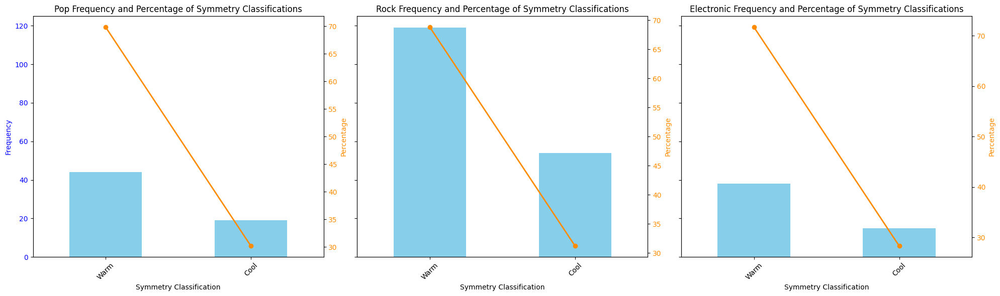

/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_41947/3339639028.py:65: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


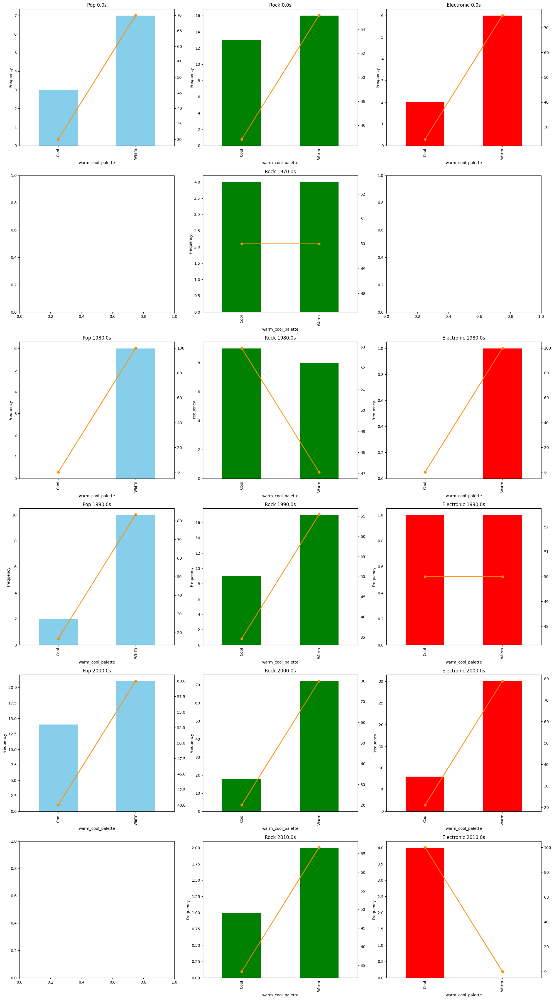

In [42]:
general_classification(ca_pop_df, ca_rock_df, ca_electronic_df, 'warm_cool_palette')
decade_classification(ca_pop_df, ca_rock_df, ca_electronic_df, 'warm_cool_palette')

### Type of palette analysis

------------- Pop ------------
               Count  Percentage
type_palette                    
Monochromatic     32   50.793651
Complex/Mixed     22   34.920635
Analogous          8   12.698413
Complementary      1    1.587302
------------- Rock ------------
               Count  Percentage
type_palette                    
Monochromatic     90   52.023121
Complex/Mixed     54   31.213873
Analogous         25   14.450867
Complementary      4    2.312139
------------- electronic ------------
               Count  Percentage
type_palette                    
Monochromatic     31   58.490566
Complex/Mixed     17   32.075472
Analogous          4    7.547170
Complementary      1    1.886792


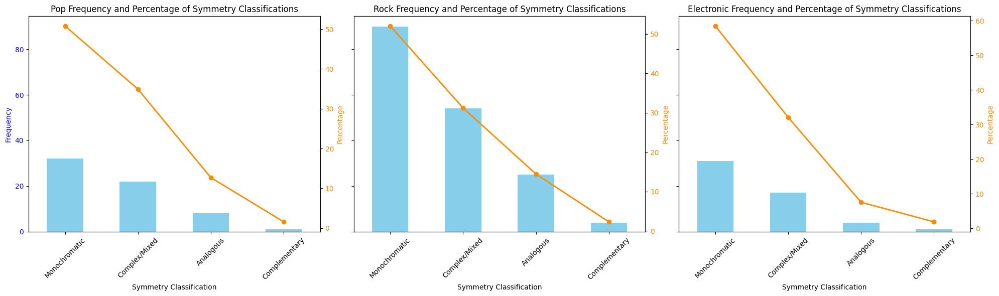

/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_41947/3339639028.py:65: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


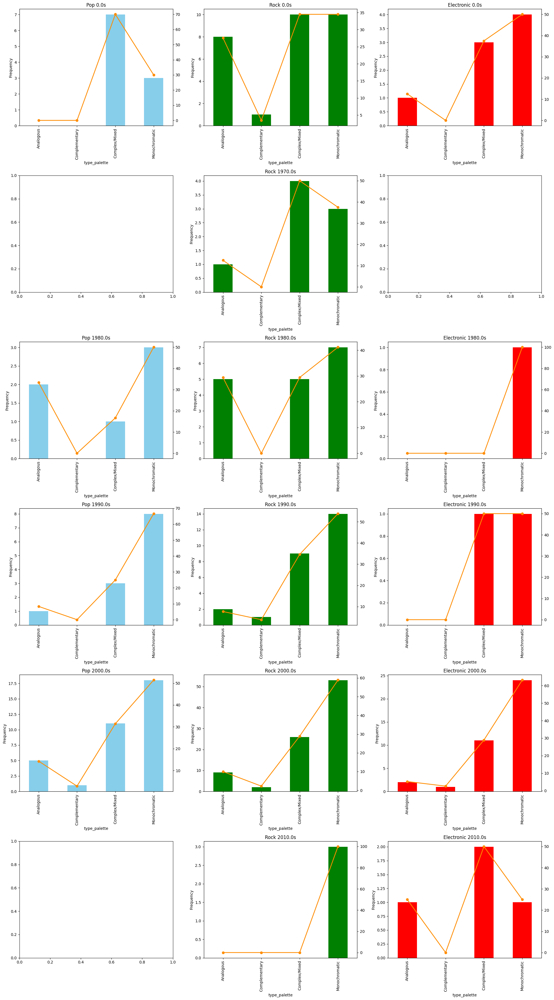

In [43]:
general_classification(ca_pop_df, ca_rock_df, ca_electronic_df, 'type_palette')
decade_classification(ca_pop_df, ca_rock_df, ca_electronic_df, 'type_palette')